In [2]:
# @title Installing requirements

!pip install --quiet --upgrade accelerate
!pip install git+https://github.com/huggingface/diffusers.git@main
!pip install controlnet_hinter==0.0.5
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 43.5 MB/s eta 0:00:00
  Cloning https://github.com/huggingface/diffusers.git (to revision main) to /tmp/pip-req-build-qgi8zkkj
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/diffusers.git /tmp/pip-req-build-qgi8zkkj
  Resolved https://github.com/huggingface/diffusers.git to commit 0d68ddf3275b20b0d12cfd3d0a9f002fecfe001c
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.29.0.dev0-py3-none-any.whl size=2178796 sha256=4507cbef5ac6c097a064d7b0b3ac1fc666ecad895fb1af5fee3a44120f19b5c8
  Stored in directory: /tmp/pip-ephem-wheel-cache-2uxqrwnn/wheels/2f/e1/9c/c4e22972ee698b020d29ed7cc914d898247d01e302f25df1a4
Successfully built diffusers
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Load It-Jim Logo

In [3]:
from google.colab import drive
from PIL import Image
import matplotlib.pyplot as plt

drive.mount('/content/drive')

Mounted at /content/drive


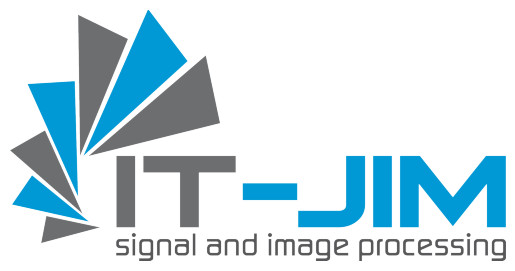

In [4]:
# Path to your logo image in Google Drive
logo_image_path = '/content/drive/MyDrive/It-Jim/It-Jim_logo.png'

# Load the image
logo_image = Image.open(logo_image_path)

# Display the image
plt.imshow(logo_image)
plt.axis('off')
plt.show()

In [5]:
print(logo_image.size)

(2141, 1084)


In [6]:
# @title Setting up the Control net map

import controlnet_hinter

# Mapping for ControlNet Model path and hinter function

CONTROLNET_MAPPING = {
    "canny_edge": {
        "model_id": "lllyasviel/sd-controlnet-canny",
        "hinter": controlnet_hinter.hint_canny
    },
    "pose": {
        "model_id": "lllyasviel/sd-controlnet-openpose",
        "hinter": controlnet_hinter.hint_openpose
    },
    "depth": {
        "model_id": "lllyasviel/sd-controlnet-depth",
        "hinter": controlnet_hinter.hint_depth
    },
    "scribble": {
        "model_id": "lllyasviel/sd-controlnet-scribble",
        "hinter": controlnet_hinter.hint_scribble,
    },
    "segmentation": {
        "model_id": "lllyasviel/sd-controlnet-seg",
        "hinter": controlnet_hinter.hint_segmentation,
    },
    "normal": {
        "model_id": "lllyasviel/sd-controlnet-normal",
        "hinter": controlnet_hinter.hint_normal,
    },
    "hed": {
        "model_id": "lllyasviel/sd-controlnet-hed",
        "hinter": controlnet_hinter.hint_hed,
    },
    "hough": {
        "model_id": "lllyasviel/sd-controlnet-mlsd",
        "hinter": controlnet_hinter.hint_hough,
    }
}

### ControlNet Types and Their Use Cases

**canny_edge:**

* Description: Uses Canny edge detection to create an edge map of the input image.
* Use Case: Useful for maintaining the structure of the input image while allowing for creative modifications and enhancements. Ideal for applications where you want to preserve the geometric outline of the original image.

**pose:**

* Description: Uses OpenPose to detect and represent human poses in the image.
* Use Case: Ideal for generating images with specific human poses or enhancing images with articulated human figures. Useful in scenarios involving human activities, animations, or any application where human posture and motion are critical.

**depth:**

* Description: Uses depth estimation to create a depth map of the input image.
* Use Case: Useful for generating images with realistic 3D effects or depth-aware modifications. This is ideal for applications that require a sense of depth and spatial relationships, such as augmented reality, 3D modeling, and virtual environments.

**scribble:**

* Description: Uses a simple sketch or scribble to guide the image generation.
* Use Case: Allows for creative freedom by using rough sketches as a basis for detailed image generation. Great for concept art, storyboarding, and scenarios where a basic outline is provided and detailed artwork is generated.

**segmentation:**

* Description: Uses semantic segmentation to identify and separate different regions or objects in the image.
* Use Case: Useful for generating images with distinct objects or regions, ensuring accurate placement and interaction between elements. Ideal for applications in medical imaging, autonomous driving, and any context where precise object delineation is necessary.

**normal:**

* Description: Uses normal maps to represent the surface normals of the input image.
* Use Case: Ideal for enhancing the textural details and surface properties of the generated image. Suitable for 3D rendering, gaming, and scenarios where surface detail and texture are important.

**hed:**

* Description: Uses Holistically-Nested Edge Detection (HED) to create an edge map.
* Use Case: Similar to canny_edge but can provide more detailed and intricate edge maps for complex structures. Useful for applications that require detailed and nuanced edge detection, such as architectural rendering and technical illustrations.

**hough:**

* Description: Uses Hough Line Transform to detect lines in the image.
* Use Case: Suitable for images with strong linear structures or for emphasizing lines and geometric shapes. Ideal for applications in technical drawing, architectural visualization, and any scenario where linear features are prominent.

## After researching through control types I chose "canny_edge", "scribble", "hed", "hough" for our task, because they are most suitable for current It-Jim logo. For example, "hough" control type is suitable for images with strong linear structures or for emphasizing lines and geometric shapes, whereas current It-Jim logo consist of geometric shapes and lines...

In [ ]:
controlnet_types = ["canny_edge", "scribble", "hed", "hough"]

In [ ]:
# @title Loading The Pipeline for Juggernaut

from diffusers import DiffusionPipeline, LCMScheduler,DDIMScheduler
from diffusers import AutoPipelineForText2Image, StableDiffusionControlNetPipeline, ControlNetModel
import torch
from diffusers.utils import load_image


# Define model path for best anime model
base_model_path =  "digiplay/Juggernaut_final"

# List of controlnet types
controlnet_types = ["canny_edge", "hed", "hough"]

# Dictionary to store pipelines
pipelines = {}

# Initialize and store pipelines for each controlnet type
for controlnet_type in controlnet_types:
    controlnet = ControlNetModel.from_pretrained(CONTROLNET_MAPPING[controlnet_type]["model_id"], torch_dtype=torch.float16).to("cuda")
    pipe = StableDiffusionControlNetPipeline.from_pretrained(base_model_path,
                                                             controlnet=controlnet,
                                                             torch_dtype=torch.float16,
                                                             ).to("cuda")
    pipelines[controlnet_type] = pipe

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Some Parameters of Stable Diffusion Pipelines

* “width” and “height”: These manage the resolution of the generation.

* “guidance_scale”: Prompt guidance dictates how closely the generation follows a given prompt. The default value is 7, with a recommended value range of 4 to 9.

* “image” (control_image): This is used to guide or control the generation based on another reference image.

* “controlnet_conditing_scale”: This influences the strength of the guidance image, with a recommended value range of 0.0 to 1.5.

* “num_inference_steps”: The higher the value, the better quality we get, with a recommended value range of 20 to 50.

In [10]:
# @title Define the testing function

def test_pipelines(save_dir, logo_image_path, controlnet_types, prompts, negative_prompt, no_of_steps=20, guidance_scale=7.0, controlnet_conditioning_scale=1.0, model_name = "Juggernaut", trial=None):

    logo_image = Image.open(logo_image_path)

    for controlnet_type in controlnet_types:

        control_image = CONTROLNET_MAPPING[controlnet_type]["hinter"](logo_image)
        pipe = pipelines[controlnet_type]

        print(f"CONTROL TYPE = {controlnet_type}")

        for prompt in prompts:

            # Run the inference
            my_images = pipe(
                prompt=prompt,
                width=512,
                height=256,
                negative_prompt=negative_prompt,
                image=control_image,
                controlnet_conditioning_scale=controlnet_conditioning_scale,
                num_inference_steps=no_of_steps,
                guidance_scale=guidance_scale,
            )

            # Get the first image from the image generations object
            first_image = my_images.images[0]

            print(prompt)
            # Display the image
            plt.imshow(first_image)
            plt.axis('off')
            plt.show()
            print("*" * 30)

            # Save the  generated image to Google Drive folder
            import os
            save_dir = save_dir
            os.makedirs(save_dir, exist_ok=True)

            if trial == None:
              save_path = os.path.join(save_dir, f"{model_name}_{controlnet_type}_{prompts.index(prompt) + 1}_prompt.png")
            else:
                save_path = os.path.join(save_dir, f"{model_name}_{controlnet_type}_{prompts.index(prompt) + 1}_tiral{trial}_prompt.png")

            first_image.save(save_path)
            print(f"Image saved to: {save_path}")



In [ ]:
torch.cuda.empty_cache()

CONTROL TYPE = canny_edge


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


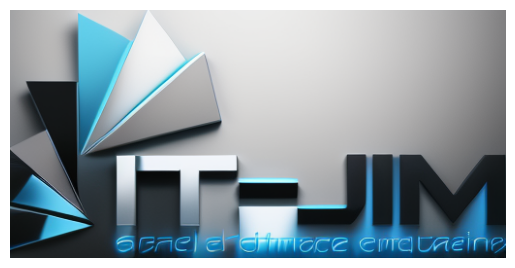

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_1_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


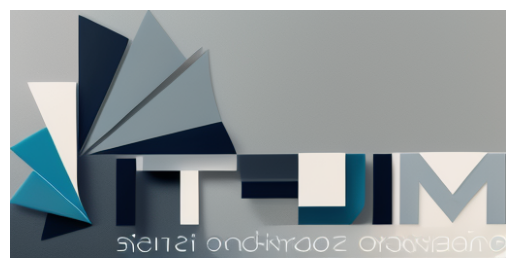

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


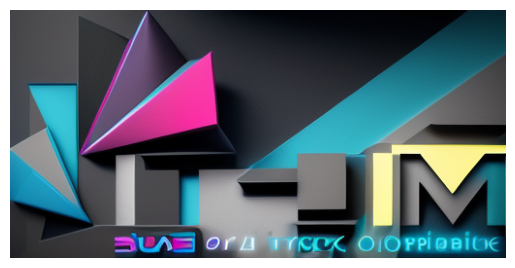

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


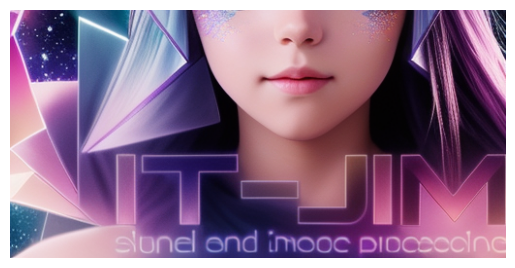

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_4_prompt.png
Downloading: "https://huggingface.co/lllyasviel/ControlNet/resolve/main/annotator/ckpts/network-bsds500.pth" to /usr/local/lib/python3.10/dist-packages/annotator/ckpts/network-bsds500.pth



100%|██████████| 56.1M/56.1M [00:00<00:00, 161MB/s]


CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


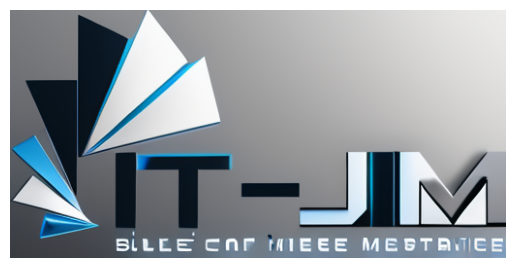

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_1_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


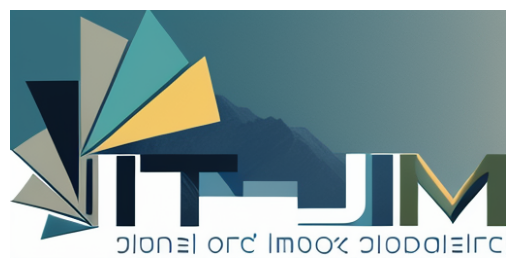

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


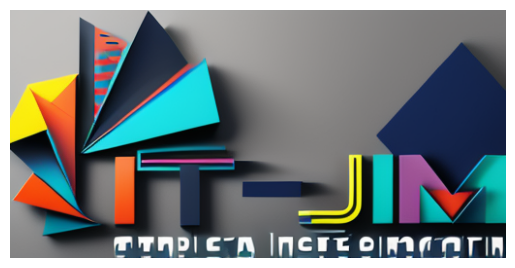

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


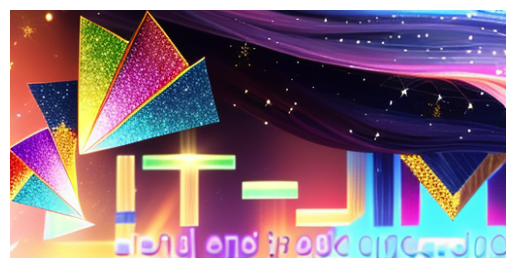

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_4_prompt.png
CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


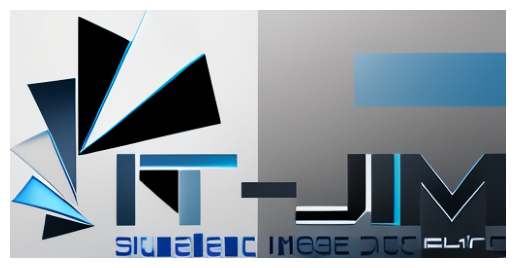

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_1_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


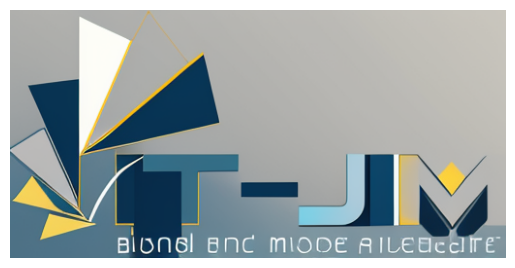

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


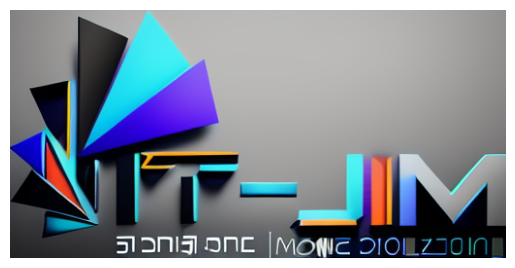

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


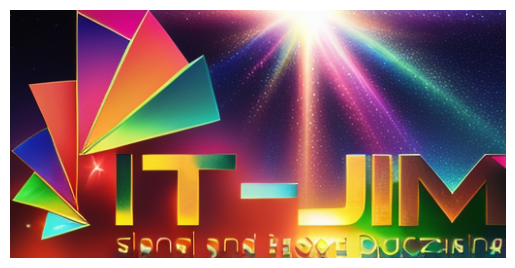

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_4_prompt.png


In [ ]:
# Define prompts and negative prompt
prompts = [
    "Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed",
    "Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional",
    "Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality",
    "Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality."
]

negative_prompt = "nsfw, longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality"


# Example usage
logo_image_path = "/content/drive/MyDrive/It-Jim/It-Jim_logo.png"
save_directory = "/content/drive/MyDrive/It-Jim/generated_logos"

test_pipelines(save_directory, logo_image_path, controlnet_types, prompts, negative_prompt)


## Second trial

CONTROL TYPE = canny_edge


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


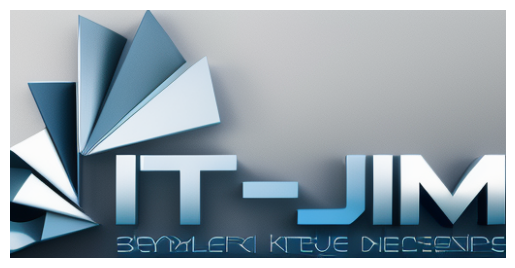

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_1_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


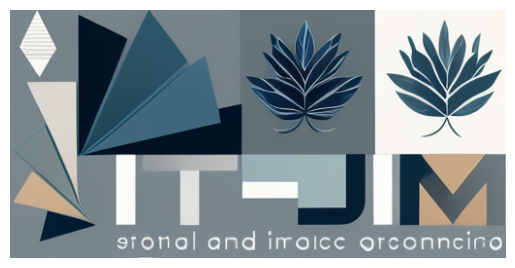

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_2_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


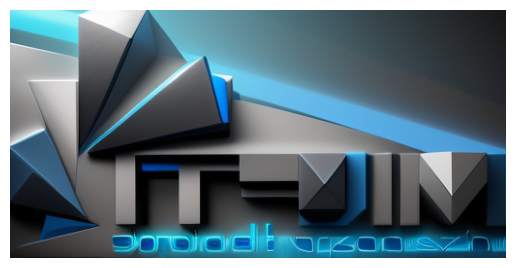

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_3_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


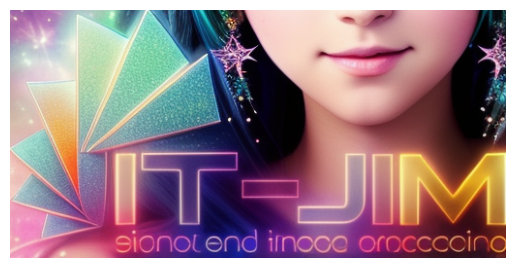

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_canny_edge_4_prompt_trial2.png
CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


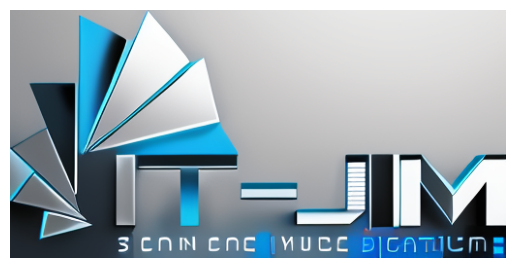

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_1_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


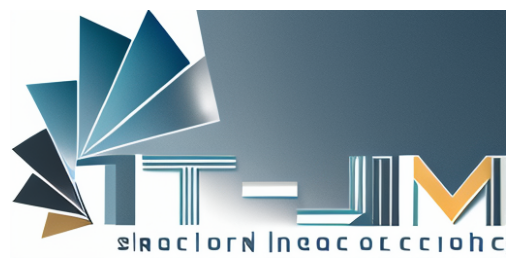

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_2_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


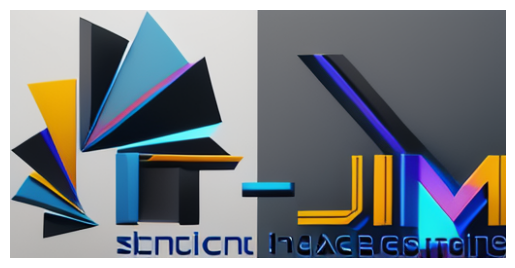

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_3_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


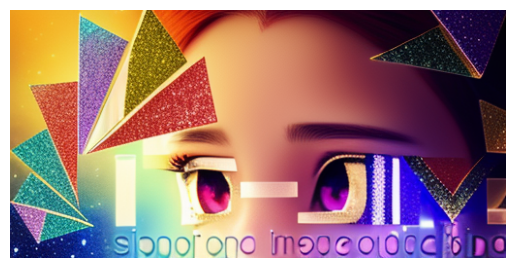

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_4_prompt_trial2.png
CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


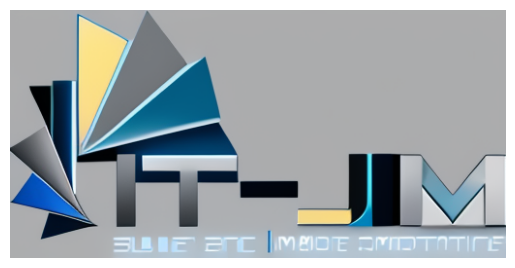

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_1_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


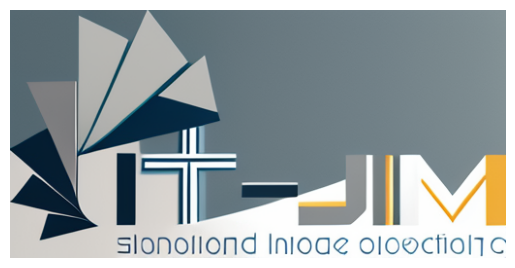

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_2_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


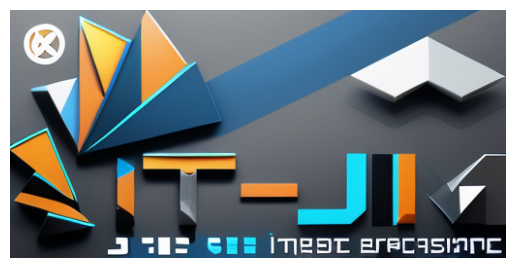

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_3_prompt_trial2.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


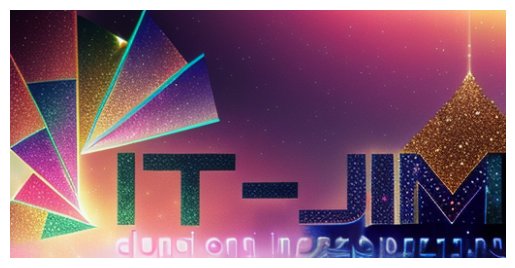

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/Juggernaut_hed_4_prompt_trial2.png


In [ ]:
test_pipelines(save_directory, logo_image_path, controlnet_types, prompts, negative_prompt, trial=2)


In [8]:
# @title Loading The Pipeline for best anime model anything-v5

from diffusers import DiffusionPipeline, LCMScheduler,DDIMScheduler
from diffusers import AutoPipelineForText2Image, StableDiffusionControlNetPipeline, ControlNetModel
import torch
from diffusers.utils import load_image


# Define model path for best anime model
best_anime_model = "stablediffusionapi/anything-v5"  # Best Anime Model

# List of controlnet types
controlnet_types = ["canny_edge", "hed", "hed"]

# Dictionary to store pipelines
pipelines = {}

# Initialize and store pipelines for each controlnet type
for controlnet_type in controlnet_types:
    controlnet = ControlNetModel.from_pretrained(CONTROLNET_MAPPING[controlnet_type]["model_id"], torch_dtype=torch.float16).to("cuda")
    pipe = StableDiffusionControlNetPipeline.from_pretrained(best_anime_model,
                                                             controlnet=controlnet,
                                                             torch_dtype=torch.float16,
                                                             ).to("cuda")
    pipelines[controlnet_type] = pipe

model_index.json:   0%|          | 0.00/584 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/520 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/465 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.58k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.45k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/582 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

CONTROL TYPE = canny_edge


  0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


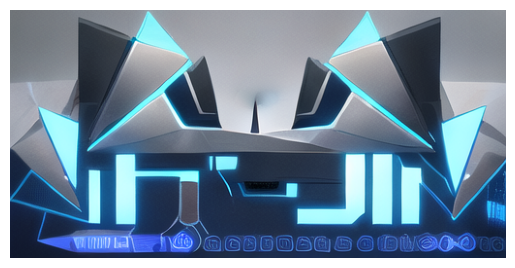

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_1_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


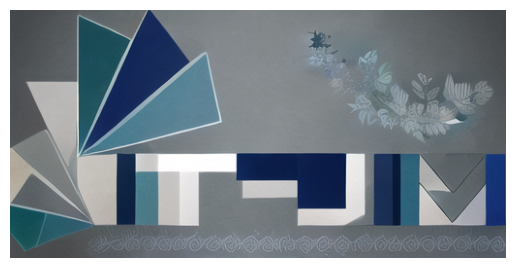

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


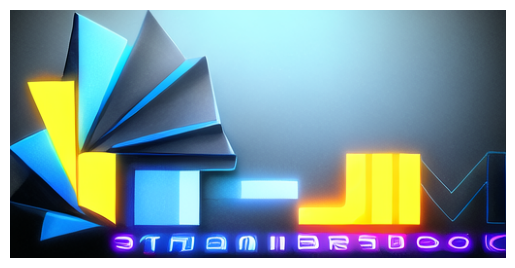

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


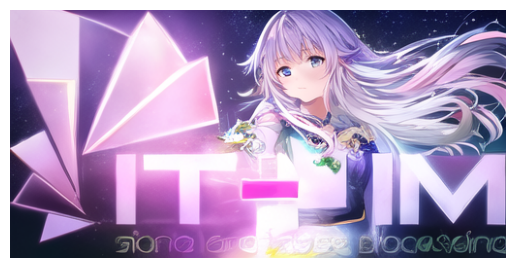

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_4_prompt.png


ModuleNotFoundError: No module named 'torchvision.transforms.functional_tensor'

In [11]:
# Define prompts and negative prompt
prompts = [
    "Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed",
    "Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional",
    "Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality",
    "Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality."
]

negative_prompt = "nsfw, longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality"


# Example usage
logo_image_path = "/content/drive/MyDrive/It-Jim/It-Jim_logo.png"
save_directory = "/content/drive/MyDrive/It-Jim/generated_logos"

test_pipelines(save_directory, logo_image_path, controlnet_types, prompts, negative_prompt, model_name="anime")


CONTROL TYPE = canny_edge


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


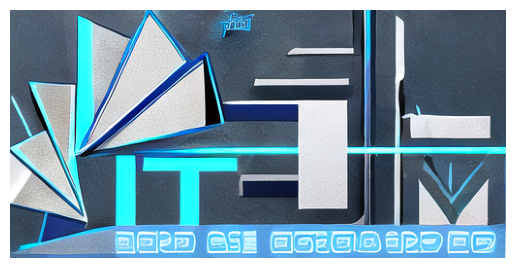

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_1_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


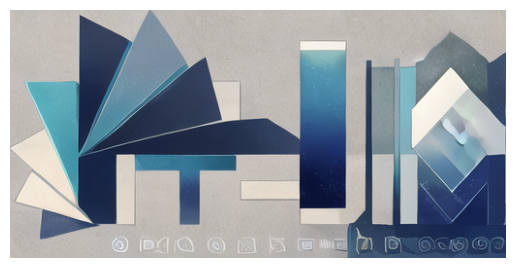

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_2_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


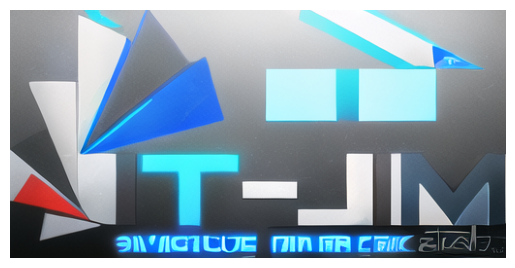

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_3_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


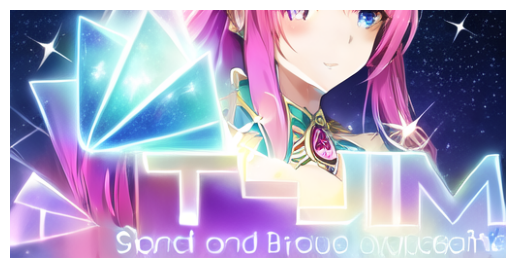

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_4_tiral2_prompt.png
Downloading: "https://huggingface.co/lllyasviel/ControlNet/resolve/main/annotator/ckpts/network-bsds500.pth" to /usr/local/lib/python3.10/dist-packages/annotator/ckpts/network-bsds500.pth



100%|██████████| 56.1M/56.1M [00:00<00:00, 70.7MB/s]


CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


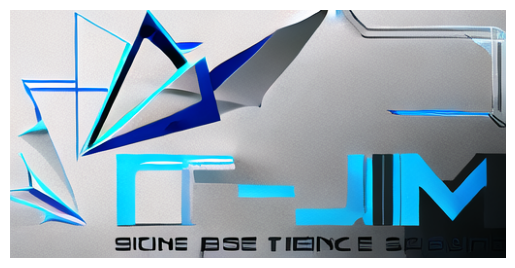

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_1_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


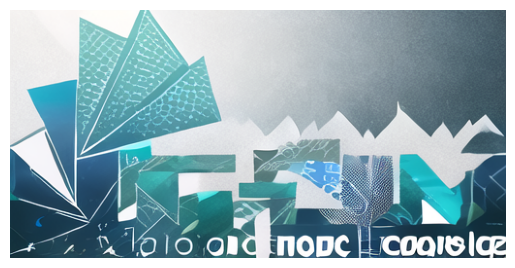

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_2_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


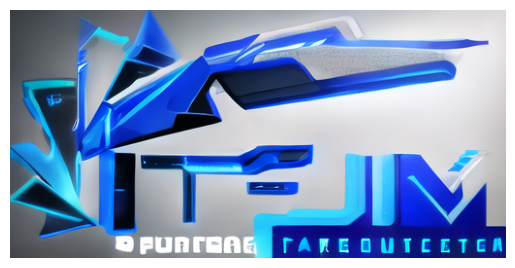

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_3_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


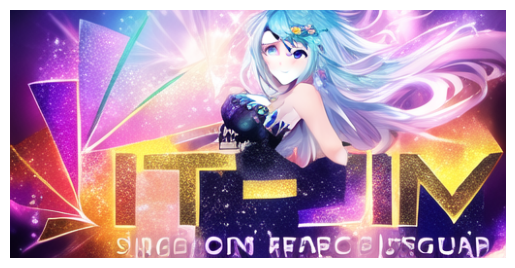

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_4_tiral2_prompt.png
CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


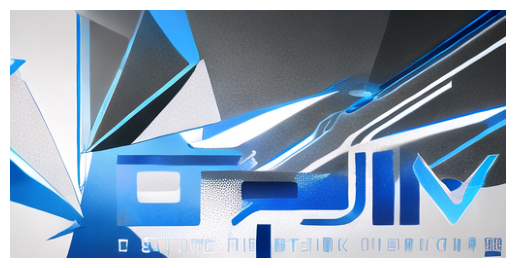

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_1_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


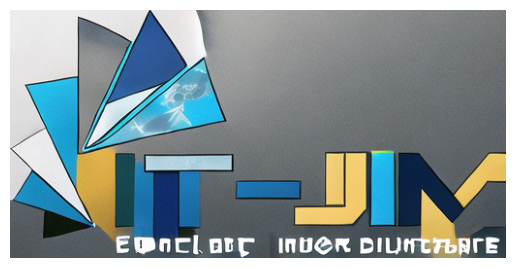

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_2_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


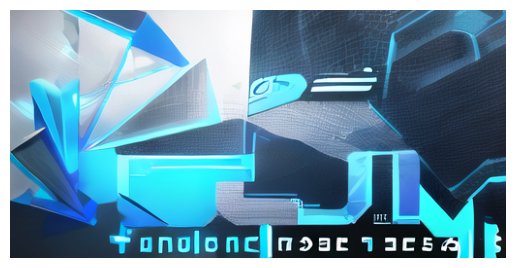

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_3_tiral2_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


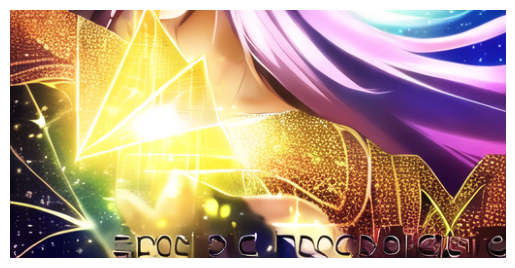

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_4_tiral2_prompt.png


In [12]:
test_pipelines(save_directory, logo_image_path, controlnet_types, prompts, negative_prompt, model_name="anime", trial=2)


CONTROL TYPE = canny_edge


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


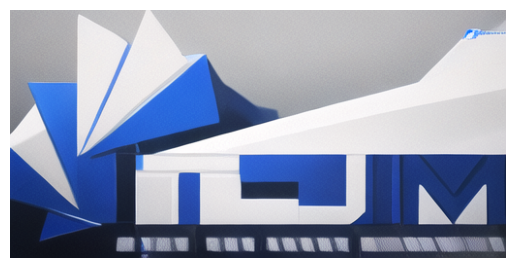

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_1_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


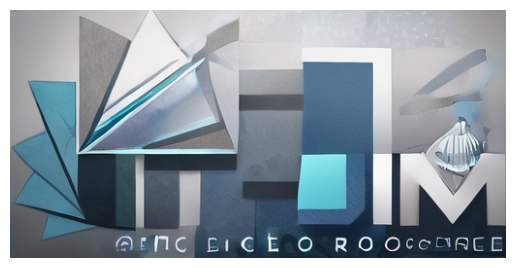

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_2_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


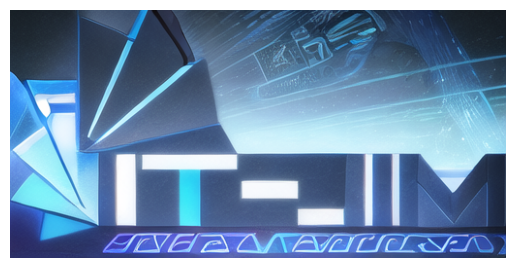

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_3_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


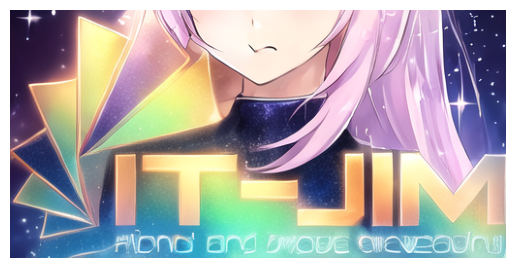

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_4_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Mystical forest scene, glowing plants, enchanted atmosphere, deep greens and blues, otherworldly creatures, fantasy art, high-resolution, highly detailed


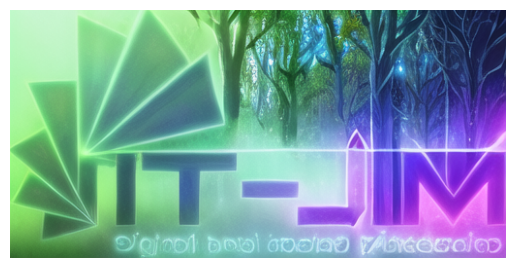

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_5_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Steampunk cityscape, intricate machinery, bronze and copper tones, Victorian architecture, bustling streets, high-resolution, highly detailed


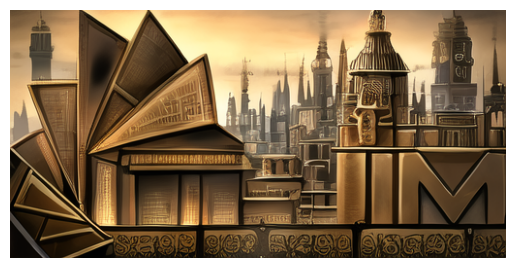

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_6_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Cyberpunk character, neon lights, futuristic attire, urban setting, dark atmosphere, high-resolution, highly detailed


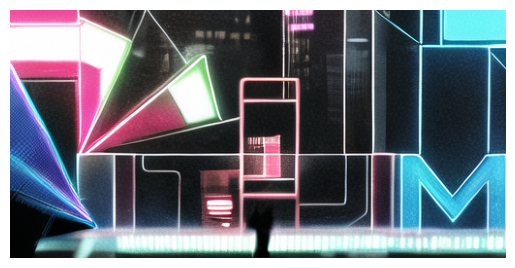

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_7_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Retro-futuristic landscape, vibrant colors, imaginative technology, 1980s sci-fi aesthetic, high-resolution, highly detailed


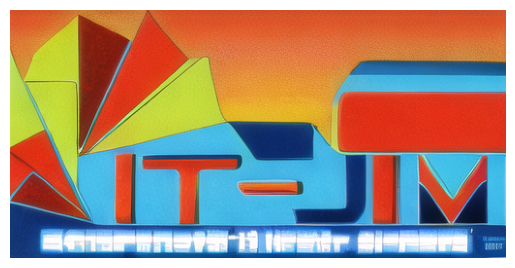

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_8_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Abstract art piece, vibrant colors, dynamic shapes, fluid forms, modern and experimental, high-resolution, highly detailed


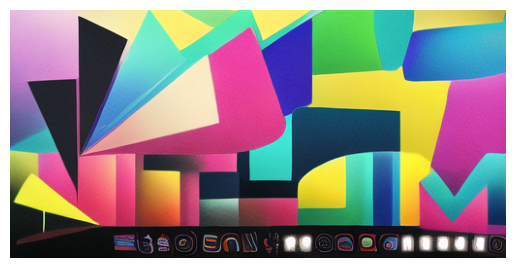

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_9_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Underwater scene, colorful coral reefs, diverse marine life, sun rays penetrating the water, serene and vibrant, high-resolution, highly detailed


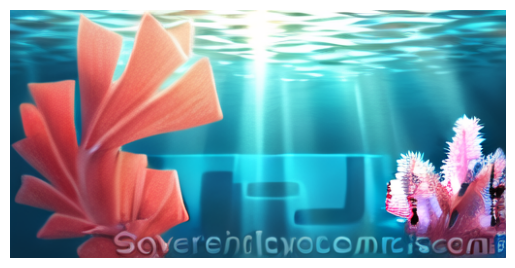

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_canny_edge_10_tiral3_prompt.png
CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


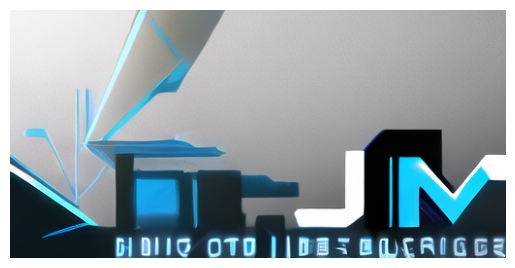

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_1_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


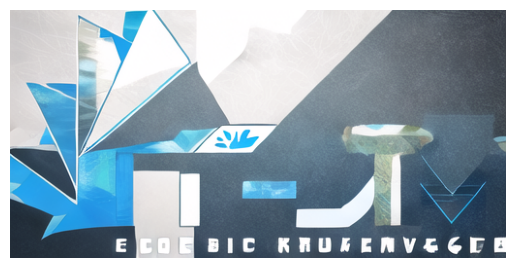

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_2_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


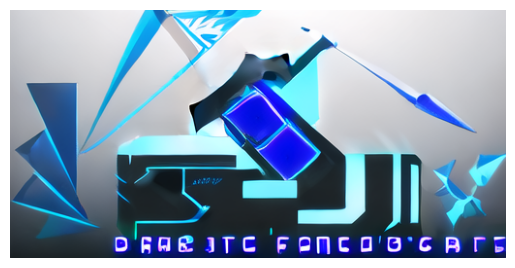

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_3_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


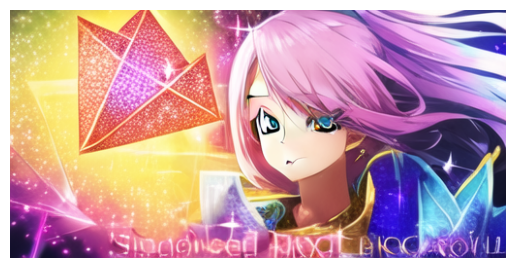

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_4_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Mystical forest scene, glowing plants, enchanted atmosphere, deep greens and blues, otherworldly creatures, fantasy art, high-resolution, highly detailed


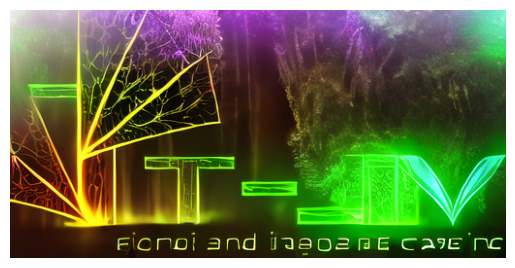

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_5_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Steampunk cityscape, intricate machinery, bronze and copper tones, Victorian architecture, bustling streets, high-resolution, highly detailed


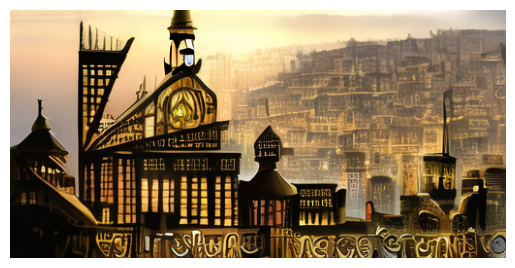

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_6_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Cyberpunk character, neon lights, futuristic attire, urban setting, dark atmosphere, high-resolution, highly detailed


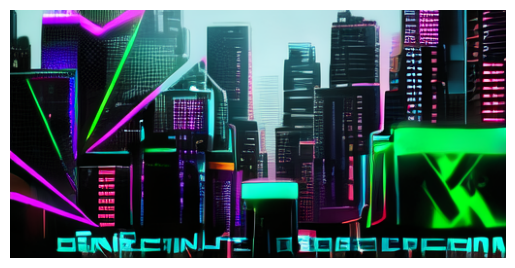

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_7_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Retro-futuristic landscape, vibrant colors, imaginative technology, 1980s sci-fi aesthetic, high-resolution, highly detailed


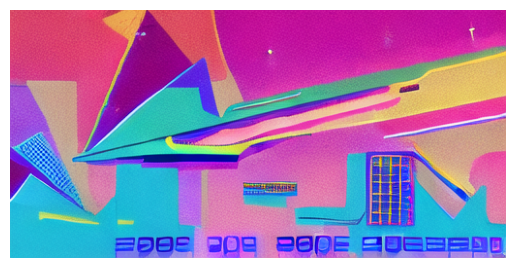

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_8_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Abstract art piece, vibrant colors, dynamic shapes, fluid forms, modern and experimental, high-resolution, highly detailed


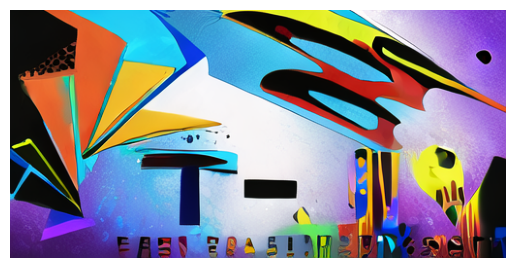

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_9_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Underwater scene, colorful coral reefs, diverse marine life, sun rays penetrating the water, serene and vibrant, high-resolution, highly detailed


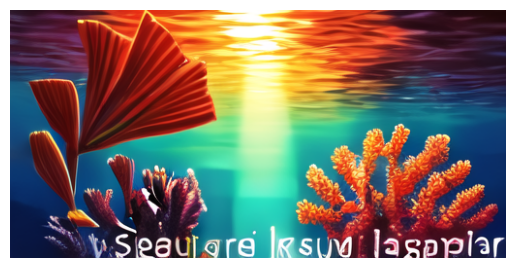

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_10_tiral3_prompt.png
CONTROL TYPE = hed


  0%|          | 0/20 [00:00<?, ?it/s]

Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed


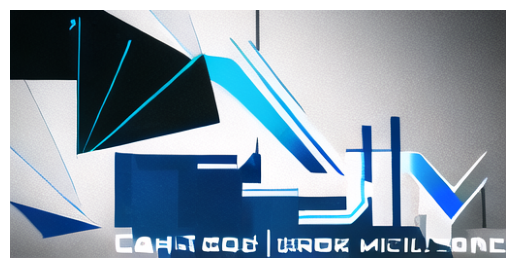

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_1_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional


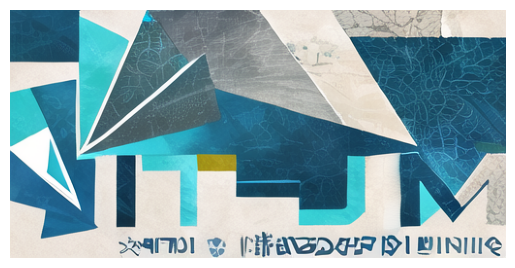

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_2_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality


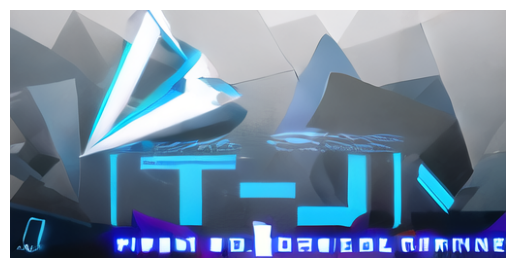

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_3_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.


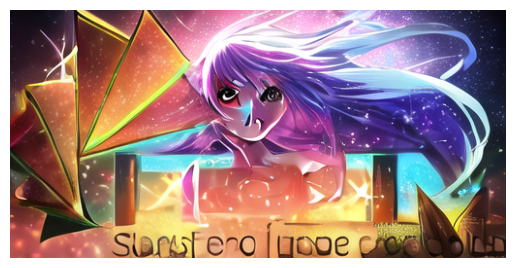

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_4_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Mystical forest scene, glowing plants, enchanted atmosphere, deep greens and blues, otherworldly creatures, fantasy art, high-resolution, highly detailed


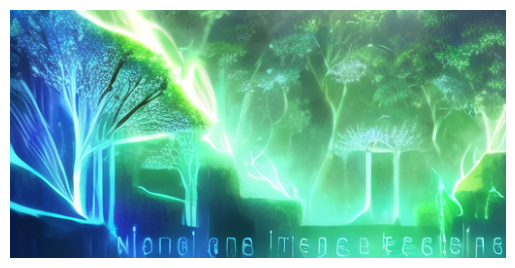

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_5_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Steampunk cityscape, intricate machinery, bronze and copper tones, Victorian architecture, bustling streets, high-resolution, highly detailed


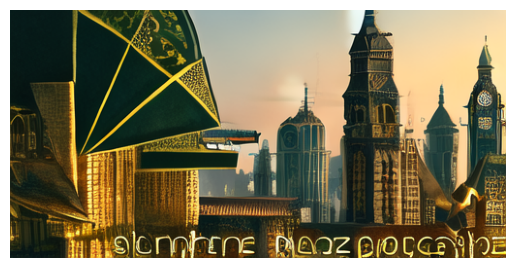

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_6_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Cyberpunk character, neon lights, futuristic attire, urban setting, dark atmosphere, high-resolution, highly detailed


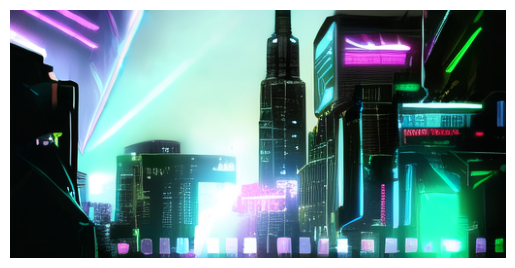

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_7_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Retro-futuristic landscape, vibrant colors, imaginative technology, 1980s sci-fi aesthetic, high-resolution, highly detailed


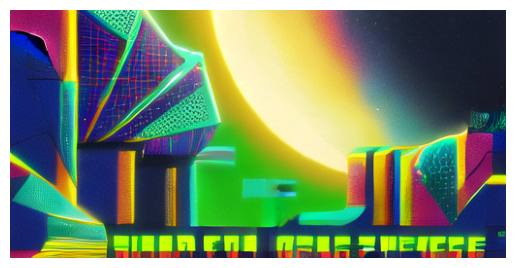

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_8_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Abstract art piece, vibrant colors, dynamic shapes, fluid forms, modern and experimental, high-resolution, highly detailed


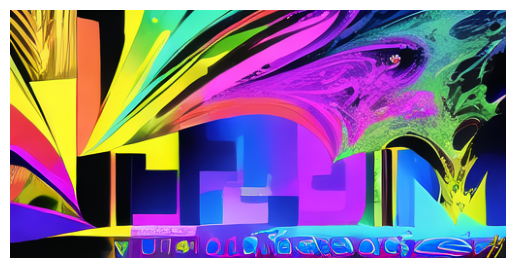

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_9_tiral3_prompt.png


  0%|          | 0/20 [00:00<?, ?it/s]

Underwater scene, colorful coral reefs, diverse marine life, sun rays penetrating the water, serene and vibrant, high-resolution, highly detailed


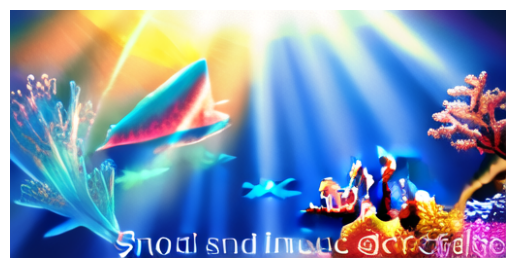

******************************
Image saved to: /content/drive/MyDrive/It-Jim/generated_logos/anime_hed_10_tiral3_prompt.png


In [14]:
# Define prompts and negative prompt
prompts = [
    "Modern tech logo, futuristic design, sleek lines, incorporating blue and gray colors, high-tech feel, minimalist, clean edges, digital aesthetics, best quality, highly detailed",
    "Nature-inspired logo, incorporating blue and gray colors, abstract leaves and geometric shapes, organic and modern blend, eco-friendly feel, high-resolution, detailed, clean and professional",
    "Futuristic abstract logo, vibrant colors, incorporating blue and gray, dynamic shapes, geometric patterns, modern design, high-tech look, glowing edges, 3D elements, highly detailed, professional quality",
    "Beautiful anime girl with sparkling glitter, vibrant colors, detailed eyes, flowing hair, magical aura, fantasy setting, high-resolution, highly detailed, enchanting, best quality.",
    "Mystical forest scene, glowing plants, enchanted atmosphere, deep greens and blues, otherworldly creatures, fantasy art, high-resolution, highly detailed",
    "Steampunk cityscape, intricate machinery, bronze and copper tones, Victorian architecture, bustling streets, high-resolution, highly detailed",
    "Cyberpunk character, neon lights, futuristic attire, urban setting, dark atmosphere, high-resolution, highly detailed",
    "Retro-futuristic landscape, vibrant colors, imaginative technology, 1980s sci-fi aesthetic, high-resolution, highly detailed",
    "Abstract art piece, vibrant colors, dynamic shapes, fluid forms, modern and experimental, high-resolution, highly detailed",
    "Underwater scene, colorful coral reefs, diverse marine life, sun rays penetrating the water, serene and vibrant, high-resolution, highly detailed"
]


test_pipelines(save_directory, logo_image_path, controlnet_types, prompts, negative_prompt, model_name="anime", trial=3)


## I bet there are some good ones!

### I missclicked and forgot to add "hough" for contorlnettype, so let's try our models again!
#### It was an interesting part of experimenting with anything v5 model, but now, let's try to make up with good prompts and use Juggernaut to create really some kind of logo that would really fit it-Jim's company.

In [23]:
torch.cuda.empty_cache()

In [24]:
# Define model path for best anime model
base_model_path =  "digiplay/Juggernaut_final"

# List of controlnet types
controlnet_types = ["canny_edge", "hed", "hough"]

# Dictionary to store pipelines
pipelines = {}

# Initialize and store pipelines for each controlnet type
for controlnet_type in controlnet_types:
    controlnet = ControlNetModel.from_pretrained(CONTROLNET_MAPPING[controlnet_type]["model_id"], torch_dtype=torch.float16).to("cuda")
    pipe = StableDiffusionControlNetPipeline.from_pretrained(base_model_path,
                                                             controlnet=controlnet,
                                                             torch_dtype=torch.float16,
                                                             ).to("cuda")
    pipelines[controlnet_type] = pipe

OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 